In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from matplotlib import rc

# Load a kaggle data from example

Data [House Prices: Advanced Regression Techniques](https://www.kaggle.com/c/house-prices-advanced-regression-techniques)

In [2]:
import requests

url = "https://raw.githubusercontent.com/cockles98/MachineLearning_from_Scratch/master/data/house_prices/train.csv"
response = requests.get(url)

with open("house_prices_train.csv", "wb") as file:
    file.write(response.content)

In [3]:
df_train = pd.read_csv('house_prices_train.csv')

# Data Exploration

In [4]:
df_train['SalePrice'].describe()

count      1460.000000
mean     180921.195890
std       79442.502883
min       34900.000000
25%      129975.000000
50%      163000.000000
75%      214000.000000
max      755000.000000
Name: SalePrice, dtype: float64

C:\Users\felip\AppData\Local\Temp\ipykernel_8088\2818368565.py:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df_train['SalePrice']);


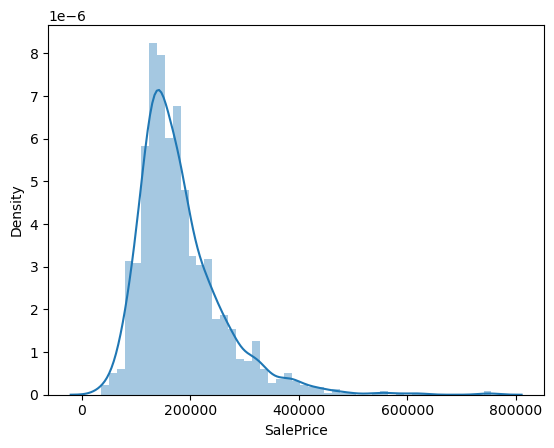

In [5]:
sns.distplot(df_train['SalePrice']);

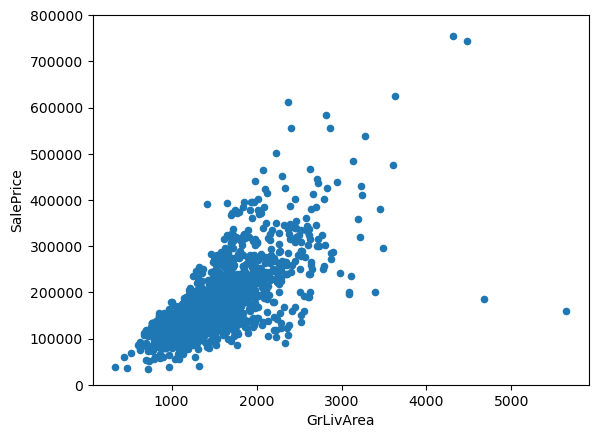

In [6]:
var = 'GrLivArea'
data = pd.concat([df_train['SalePrice'], df_train[var]], axis=1)
data.plot.scatter(x=var, y='SalePrice', ylim=(0,800000));

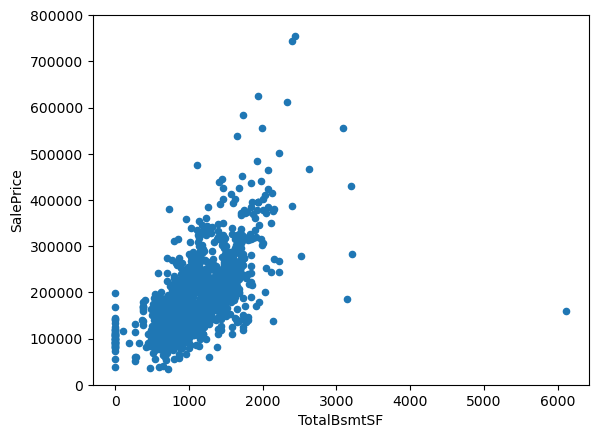

In [7]:
var = 'TotalBsmtSF'
data = pd.concat([df_train['SalePrice'], df_train[var]], axis=1)
data.plot.scatter(x=var, y='SalePrice', ylim=(0,800000));

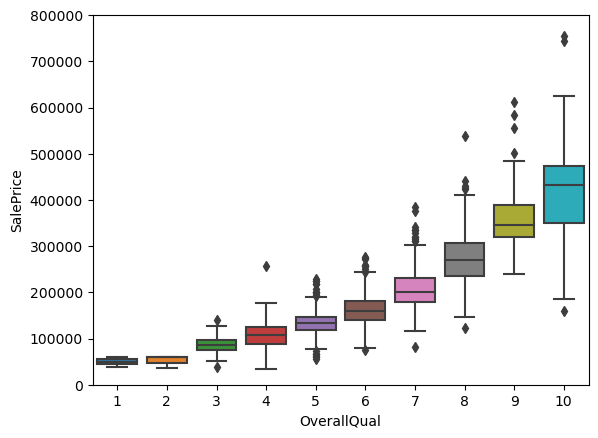

In [8]:
var = 'OverallQual'
data = pd.concat([df_train['SalePrice'], df_train[var]], axis=1)
fig = sns.boxplot(x=var, y="SalePrice", data=data)
fig.axis(ymin=0, ymax=800000);

C:\Users\felip\anaconda3\Lib\site-packages\seaborn\axisgrid.py:2095: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)
C:\Users\felip\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


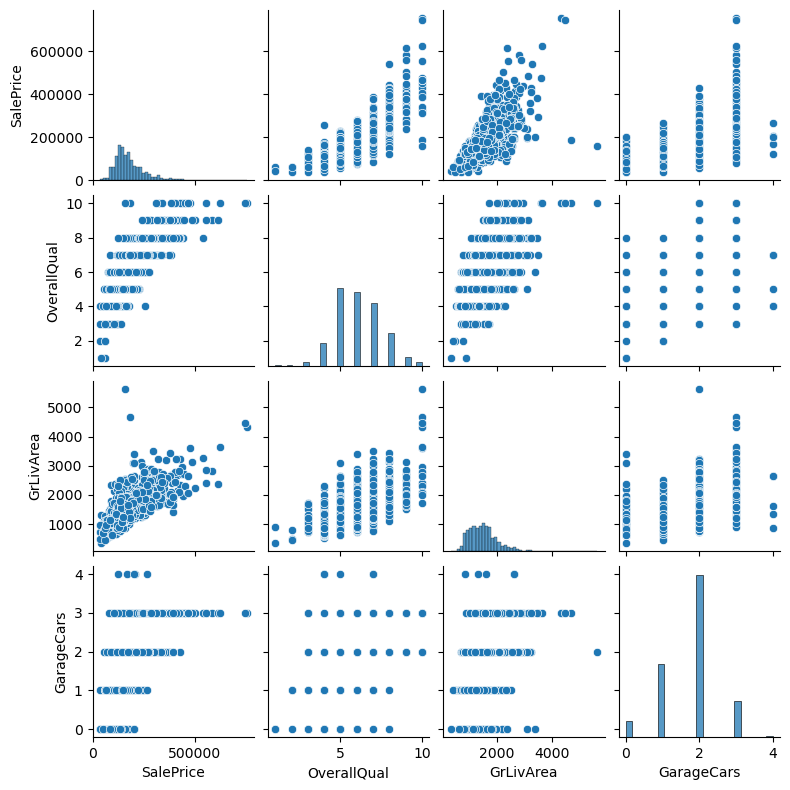

In [9]:
cols = ['SalePrice', 'OverallQual', 'GrLivArea', 'GarageCars']
sns.pairplot(df_train[cols], size = 2);

In [10]:
# Missing data
total = df_train.isnull().sum().sort_values(ascending=False)
percent = (df_train.isnull().sum()/df_train.isnull().count()).sort_values(ascending=False)
missing_data = pd.concat([total, percent], axis=1, keys=['Total', 'Percent'])
missing_data.head(20)

,Total,Percent
PoolQC,1453,0.995205
MiscFeature,1406,0.963014
Alley,1369,0.937671
Fence,1179,0.807534
MasVnrType,872,0.597260
FireplaceQu,690,0.472603
LotFrontage,259,0.177397
GarageYrBlt,81,0.055479
GarageCond,81,0.055479
GarageType,81,0.055479


# Linear Regression

In [11]:
x = df_train['GrLivArea']
y = df_train['SalePrice']

# A little preprocessing to our data using standardization
x = (x - x.mean()) / x.std()
x = np.c_[np.ones(x.shape[0]), x] 

In [12]:
class LinearRegression:
    def loss(self, h, y):
        sq_error = (h - y)**2
        n = len(y)
        return 1.0 / (2*n) * sq_error.sum()
    
    def predict(self, X):
        return np.dot(X, self._W)
  
    def _gradient_descent_step(self, X, targets, lr):
        predictions = self.predict(X)
        error = predictions - targets
        gradient = np.dot(X.T,  error) / len(X)
        self._W -= lr * gradient
      
    def fit(self, X, y, n_iter=100000, lr=0.01):
        self._W = np.zeros(X.shape[1])
        self._cost_history = []
        self._w_history = [self._W]
        for i in range(n_iter):
            prediction = self.predict(X)
            cost = self.loss(prediction, y)
            self._cost_history.append(cost)
            self._gradient_descent_step(x, y, lr)
            self._w_history.append(self._W.copy())
        return self

In [13]:
regressor = LinearRegression().fit(x, y, n_iter=2000, lr=0.01)

In [14]:
# Final weights
regressor._W

array([180921.19555322,  56294.90199925])

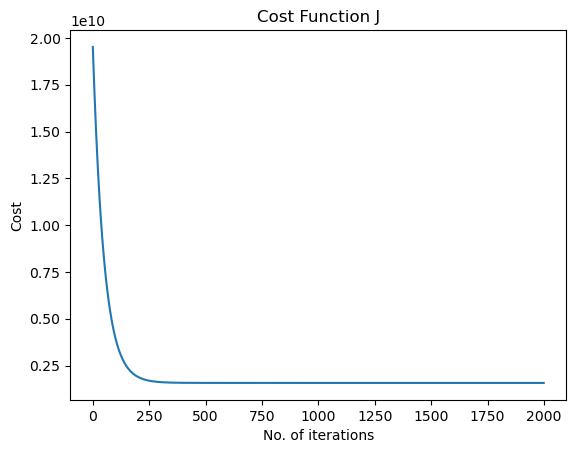

In [15]:
# Cost function
plt.title('Cost Function J')
plt.xlabel('No. of iterations')
plt.ylabel('Cost')
plt.plot(regressor._cost_history)
plt.show()

An animation of the regression fit

In [16]:
#Set the plot up
fig = plt.figure()
ax = plt.axes()
plt.title('Sale Price vs Living Area')
plt.xlabel('Living Area in square feet (normalised)')
plt.ylabel('Sale Price ($)')
plt.scatter(x[:,1], y)
line, = ax.plot([], [], lw=2, color='red')
annotation = ax.text(-1, 700000, '')
annotation.set_animated(True)
plt.close()

#Generate the animation data
def init():
    line.set_data([], [])
    annotation.set_text('')
    return line, annotation

# animation function
def animate(i):
    x = np.linspace(-5, 20, 1000)
    y = regressor._w_history[i][1]*x + regressor._w_history[i][0]
    line.set_data(x, y)
    annotation.set_text('Cost = %.2f e10' % (regressor._cost_history[i]/10000000000))
    return line, annotation

anim = animation.FuncAnimation(fig, animate, init_func=init,
                               frames=300, interval=10, blit=True)

rc('animation', html='jshtml')

anim

# Multivariable Linear Regression

Let's add more variables

In [17]:
x = df_train[['OverallQual', 'GrLivArea', 'GarageCars']]
x = (x - x.mean()) / x.std()
x = np.c_[np.ones(x.shape[0]), x] 

mult_var_regressor = LinearRegression().fit(x, y, n_iter=2000, lr=0.01)

In [18]:
# Final Weights
mult_var_regressor._W

array([180921.19555322,  37478.604254  ,  26631.93830568,  15921.22581327])

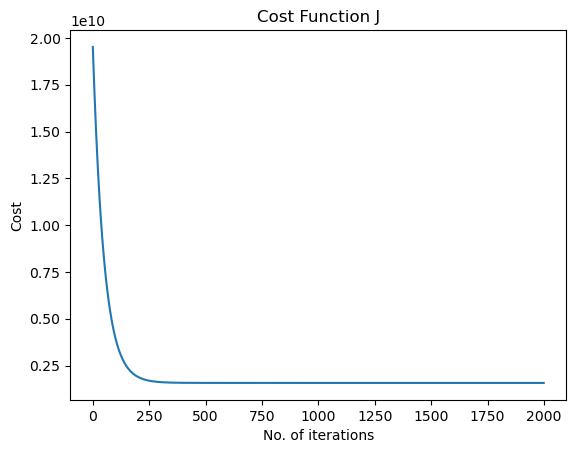

In [19]:
# Cost function
plt.title('Cost Function J')
plt.xlabel('No. of iterations')
plt.ylabel('Cost')
plt.plot(regressor._cost_history)
plt.show()